# Regional field hyperparameters
The gravity misfit in *Invert4Geom* refers to the difference between the observed gravity anomaly and the forward calculated gravity effect of a topographic surface represented by a layer of prisms. The component of this misfit we are interested in is that which results from the difference between the true topography and the starting topographic model. This is referred to as the `residual misfit`, while the remaining misfit is the `regional misfit`. Prior to the inversion, we need to estimate this `regional misfit` and remove it to isolate the `residual misfit`. 

Here we will present several methods we provide for estimating the regional component of gravity misfit. We will calculate the forward gravity effect of two topographic surfaces, the basement and Moho, from the **Bishop model**. Combined, these will make a synthetic observed gravity dataset. In this scenario, we are interested in inverting for the basement topography, and therefore need to estimate and remove the gravity effects of the Moho. To start, we will create a starting model for the basement topography from a series of known basement elevations. We will forward calculate the gravity of this starting model, and subtract it from the observed gravity to get a `gravity misfit`. From this misfit, we will then showcase several methods for estimated the regional component of the misfit.

## Import packages

In [1]:
import pathlib
import pickle

import numpy as np
import pandas as pd
import polartoolkit as ptk
import verde as vd
import xarray as xr

import invert4geom

/home/mdtanker/miniforge3/envs/invert4geom/lib/python3.12/site-packages/UQpy/__init__.py:6: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.



## Get data

Here we will load a commonly used synthetic gravity and basement topography model. It includes topography of the Moho and the crystalline basement. The gravity effect from the Moho will represent the **regional** which we are aiming to isolate. We will forward model the gravity effects of both layers, and add some noise, to create an observed gravity dataset. We will then use a series of point where we know the basement topography to create a starting model, forward calculate its gravity effect, and remove it from the observed gravity to get a gravity misfit. We will then demonstrate the range of techniques implemented within *Invert4Geom* for isolated the regional component of this gravity misfit.

In [2]:
grav_ds = xr.load_dataset("../tmp/regional_sep_grav.nc")
grav_data = invert4geom.create_data(grav_ds)
grav_data.inv.df.describe()

,northing,easting,upward,basement_grav,moho_grav,gravity_anomaly_no_noise,gravity_anomaly,uncert,forward_gravity,true_res
count,7650.000000,7650.000000,7650.0,7650.000000,7650.000000,7650.000000,7650.000000,7650.0,7650.000000,7650.000000
mean,340900.000000,191900.000000,1000.0,0.302843,100.854428,101.157271,101.157271,2.0,1.548577,-1.245734
std,103923.425856,98149.168359,0.0,23.604988,27.683439,9.703771,9.919851,0.0,24.926461,9.140039
min,162900.000000,23900.000000,1000.0,-33.028677,37.680354,75.617509,70.861220,2.0,-36.414267,-37.589976
25%,250900.000000,107900.000000,1000.0,-18.377589,82.066231,96.218487,96.092524,2.0,-17.408451,-6.242037
50%,340900.000000,191900.000000,1000.0,-4.927040,109.034686,102.149812,102.057202,2.0,-3.040309,0.182452
75%,430900.000000,275900.000000,1000.0,21.431379,123.718316,106.787344,107.006336,2.0,19.823536,4.467848
max,518900.000000,359900.000000,1000.0,58.138421,139.560469,126.329916,129.736453,2.0,59.698559,19.038660


In [3]:
constraint_points = pd.read_csv(
    "../tmp/regional_sep_constraint_points.csv", index_col=0
)
constraint_points.describe()

,easting,northing,true_upward,upward,uncert,weight
count,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000
mean,176074.067983,374901.920809,-5347.056802,-5377.150137,106.941136,0.000192
std,93521.094221,105430.197097,2146.323675,2193.119014,42.926474,0.000320
min,27437.029770,165086.148419,-8882.480862,-9295.521690,27.675267,0.000032
25%,95949.329071,307923.492200,-6589.406942,-6598.243116,77.771252,0.000058
50%,165200.779866,407905.723662,-5230.910817,-5244.731393,104.618216,0.000091
75%,265171.796613,437026.517185,-3888.562584,-3840.304455,131.788139,0.000166
max,312585.151503,514943.513495,-1383.763355,-1401.012642,177.649617,0.001306


In [4]:
grids = xr.load_dataset("../tmp/regional_sep_grids.nc")
basement_topo = grids.basement
moho_topo = grids.moho
starting_topography = grids.starting

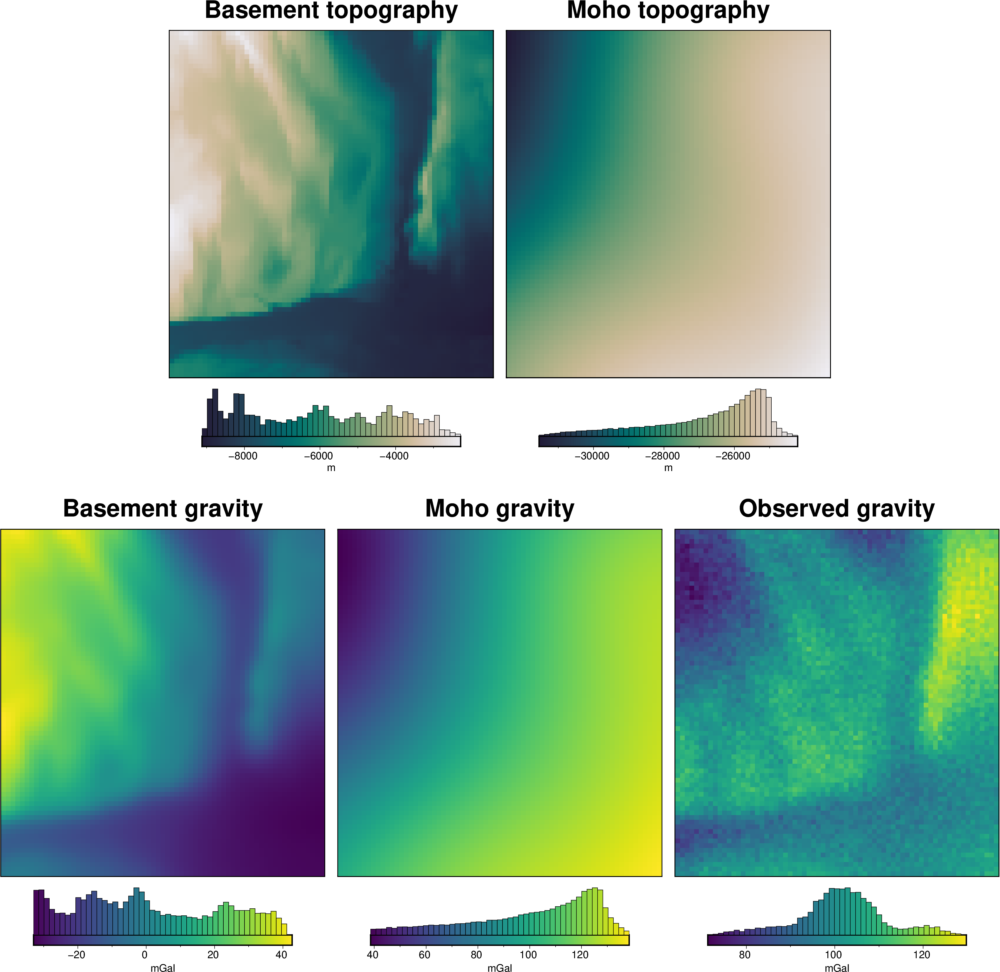

In [5]:
fig = ptk.plot_grid(
    basement_topo,
    region=grav_data.inner_region,
    fig_height=10,
    title="Basement topography",
    reverse_cpt=True,
    cmap="rain",
    cbar_label="m",
    hist=True,
)

fig = ptk.plot_grid(
    moho_topo,
    region=grav_data.inner_region,
    fig=fig,
    origin_shift="x",
    fig_height=10,
    title="Moho topography",
    reverse_cpt=True,
    cmap="rain",
    cbar_label="m",
    hist=True,
)

fig = ptk.plot_grid(
    grav_data.basement_grav,
    fig=fig,
    origin_shift="both",
    xshift_amount=-1.5,
    # yshift_amount=-1.2,
    fig_height=10,
    title="Basement gravity",
    cmap="viridis",
    cbar_label="mGal",
    hist=True,
)

fig = ptk.plot_grid(
    grav_data.moho_grav,
    fig=fig,
    region=grav_data.inner_region,
    origin_shift="x",
    fig_height=10,
    title="Moho gravity",
    cmap="viridis",
    cbar_label="mGal",
    hist=True,
)

fig = ptk.plot_grid(
    grav_data.gravity_anomaly,
    fig=fig,
    region=grav_data.inner_region,
    origin_shift="x",
    fig_height=10,
    title="Observed gravity",
    cmap="viridis",
    cbar_label="mGal",
    hist=True,
)

fig.show()

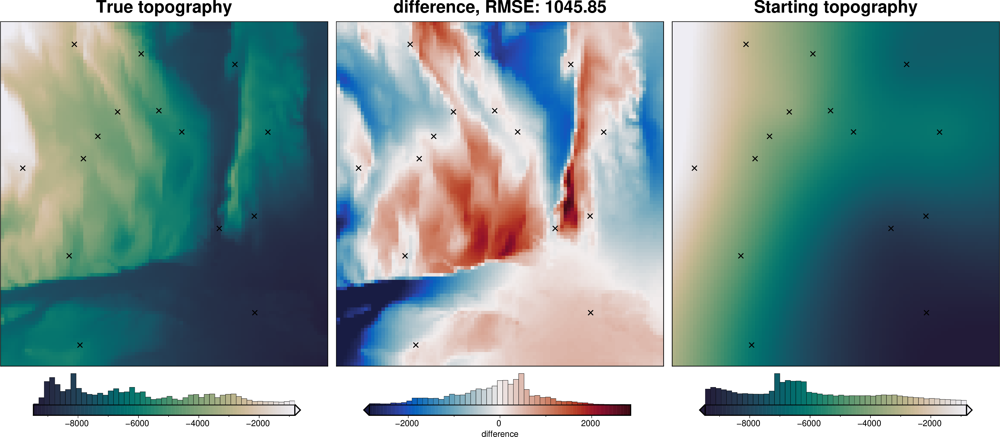

In [6]:
_ = ptk.grid_compare(
    basement_topo,
    starting_topography,
    grid1_name="True topography",
    grid2_name="Starting topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points,
    points_style="x.3c",
)

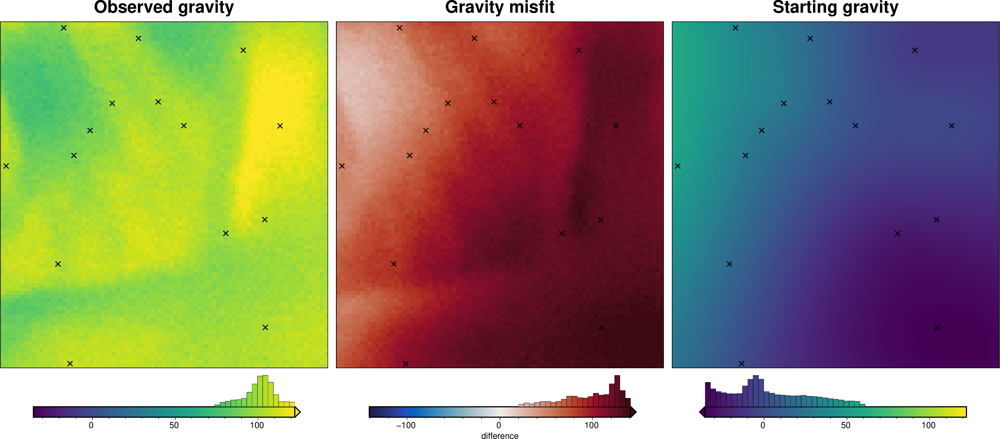

In [7]:
_ = ptk.grid_compare(
    grav_data.gravity_anomaly,
    grav_data.forward_gravity,
    grid1_name="Observed gravity",
    grid2_name="Starting gravity",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="Gravity misfit",
    rmse_in_title=False,
    points=constraint_points,
    points_style="x.3c",
)

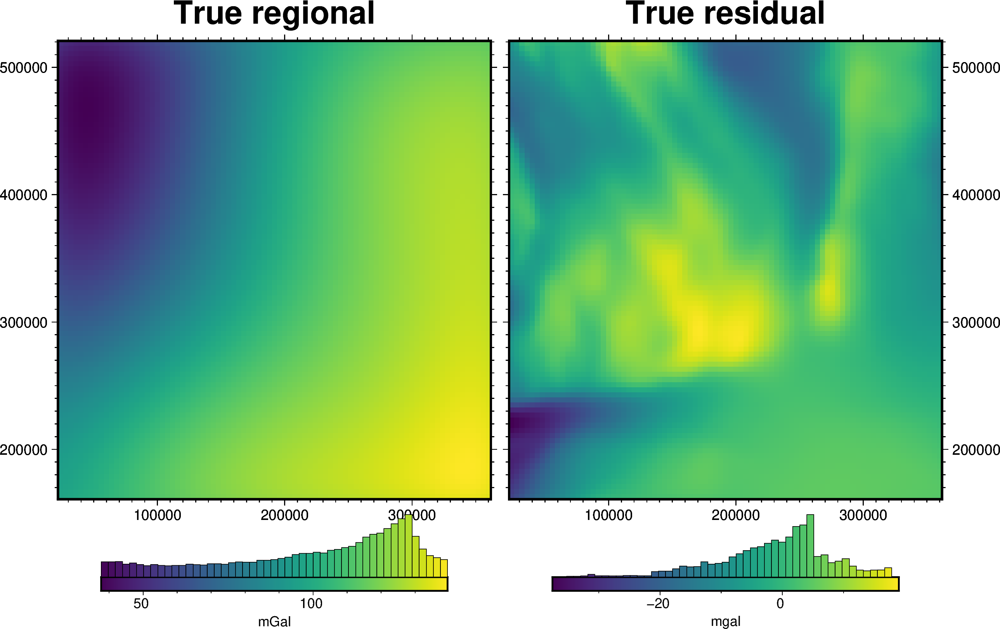

In [8]:
fig = ptk.plot_grid(
    grav_data.moho_grav,
    fig_height=10,
    title="True regional",
    cbar_label="mGal",
    hist=True,
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = ptk.plot_grid(
    grav_data.true_res,
    fig=fig,
    origin_shift="x",
    fig_height=10,
    title="True residual",
    cbar_label="mgal",
    hist=True,
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig.show()

In [9]:
# function for plotting true vs estimated regional and residual fields
def regional_comparison(grav_data):
    # compare with true regional
    _ = ptk.grid_compare(
        grav_data.moho_grav,
        grav_data.reg,
        robust=True,
        grid1_name="True regional field",
        grid2_name="Estimated regional field",
        hist=True,
        inset=False,
        verbose="q",
        title="difference",
        points=constraint_points,
        points_style="x.3c",
    )
    # compare with true residual
    _ = ptk.grid_compare(
        grav_data.true_res,
        grav_data.res,
        robust=True,
        grid1_name="True residual field",
        grid2_name="Estimated residual field",
        hist=True,
        inset=False,
        verbose="q",
        title="difference",
        points=constraint_points,
        points_style="x.3c",
    )

Each of these regional separation techniques requires the user input to pick the value of a certain parameter, each of which has a large effect on the outcome. Below these `hyperparameters` for each technique are explained:

**Filter technique**: the width of the gaussian filter

**Trend technique**: the degree-order of the trend fit to the data

**Equivalent Sources technique**: the source depth and optionally a damping parameter and cell-size for a block reduction

**Constraint Point Minimization technique**: the tension factor if using minimum curvature gridding, the damping value if using bi-harmonic spline gridding, or the source depth and damping parameters if using equivalent sources gridding.

## Hyperparameter estimation
In the [estimating a regional field](../tutorial/07_estimating_regional_field.ipynb) notebook we just picked these hyperparameter values arbitrarily. Below we show a more informed technique for choosing these hyperparameter values. This technique relies on having _a priori_ information  on the topography of interest to the inversion, in this case the basement topography. Therefore, we need to know the elevation of the basement at some locations to use these hyperparameter estimation techniques. These are referred to as **constraints**, and they would typically come from outcrops, boreholes, or other geophysical techniques such as seismic surveys. At the top of this notebook we sampled the basement topography at a series of random locations to simulate this constraints. 

Recall the the gravity misfit can be divided into regional and residual components: `misfit = regional + residual`.

In theory, the optimal `regional misfit` should result in `residual misfit` which is 0 at constraint points (we know the topography at constraints, so the starting model is exactly equal to the true topography and therefore the `residual misfit` should be very small at these points). This is achieved with a `regional misfit` equal to the full `misfit` at the constraints. This can obviously be achieved by setting the `regional misfit` entirely equal to the `total misfit` (i.e. the `residual misfit` is 0), but this would result in no change in the topography during this inversion. Therefore, the optimal `regional misfit` is the model which 1) **minimizes** the `residual misfit` at constraint points, while **maximizing** the overall amplitude of the `residual misfit`. 

This optimization can be performed as a multi-objective optimization (minimizing score 1 and maximizing score 2), or the scores can be combined (score1/score2) and the new resulting metric is optimized as a single-objective optimization. 

We will only show this hyperparameter optimization for the **constraint point minimization** technique. 

**Constraint point minimization**, uses the **constraints** to estimate the regional field, and therefore we can't use the constraint points to determine the optimal hyperparameter values. For this, we must use a cross-validation scheme, where some of the constraint points are omitted, and these are used to evaluate the effectiveness of the regional estimation. This works by 1) splitting the constraints into _testing_ and _training_ sets, 2) using only the _testing_ set to performing the **constraint point minimization** regional estimation for a range of possible hyperparameter values, and 3) assigning **scores** to each hyperparameter value. The hyperparameter value which produces the lowest value for the first score, and the highest values for the second score is the optimal one.

## Constraint point minimization hyperparameters

### Split constraint points into testing and training sets
There are a few methods we can use to split the constraints into testing and training sets:

#### 1) Random Splitting
We can randomly split the constraints into testing and training with the function `cross_validation.random_split_test_train()`, but certain constraints are likely very important and greatly effect the **constraint point minimization** technique. This is normally not the optimal technique. 

#### 2) Leave One Out
Instead of a single split, we can perform many sets of splits, each called a **Fold**. A simple technique for this is to create 1 fold per number of constraint points, where each fold leaves one point out of the training set to make up the testing set. If you have many points, this results in a lot of folds which can be very computationally demanding since we will need to perform a hyperparameter cross-validation for each fold. You can use function `cross_validation.split_test_train` with `method="LeaveOneOut"` for this.

#### 3) Block K-Fold 
The third, and in most circumstances best approach is a **Block K-Fold**. For this the constraints are split into testing and training sets **K** times, and the cross-validation is performed for each of these **K** folds. Since spatial data is common auto-correlated (nearby points have similar values), to ensure we don't overestimate cross-validation scores, it is best to split the data into spatial blocks, then split the data within these blocks into the *training* and *testing* sets. 

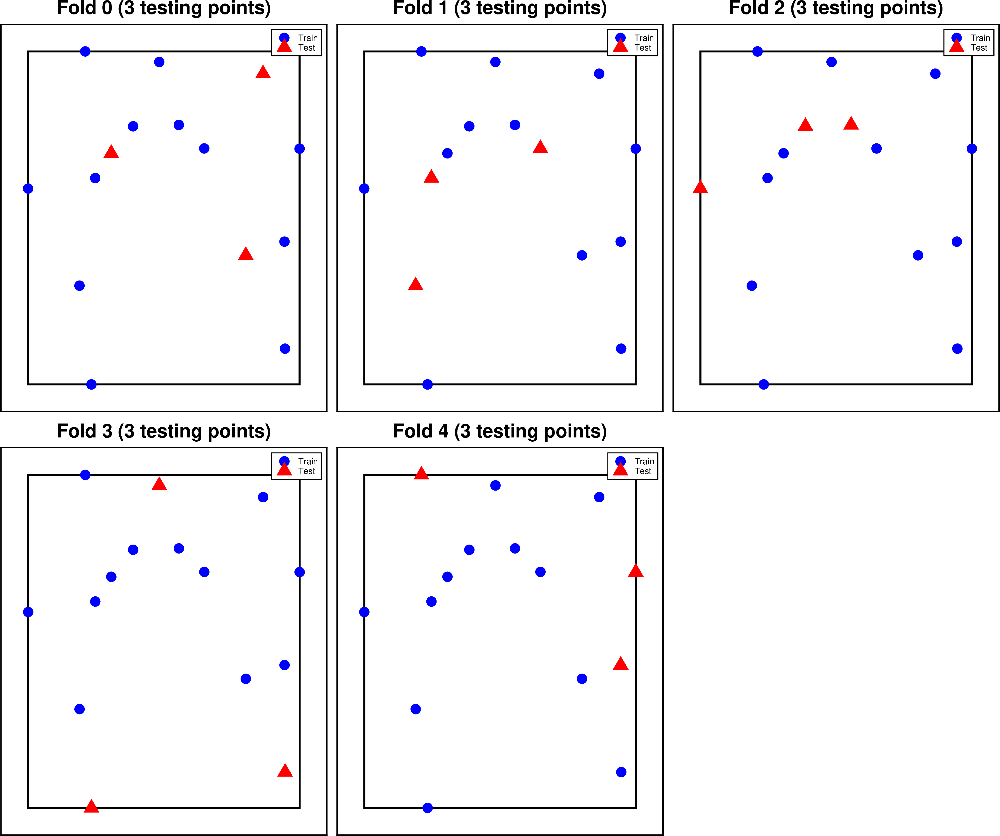

In [10]:
block_kfold_split_df = invert4geom.split_test_train(
    constraint_points,
    method="KFold",
    shape=(20, 20),
    plot=True,
)

In [11]:
block_kfold_split_df

,easting,northing,true_upward,upward,uncert,weight,fold_0,fold_1,fold_2,fold_3,fold_4
0,93942.740553,165086.148419,-6166.691339,-6151.184549,123.333827,0.000066,train,train,train,test,train
1,185744.836752,437747.618234,-5230.910817,-5244.731393,104.618216,0.000091,train,train,test,train,train
2,165200.779866,503888.251841,-4551.466895,-4493.169645,91.029338,0.000121,train,train,train,test,train
3,312585.151503,412789.886738,-6178.090981,-6165.129332,123.561820,0.000065,train,train,train,train,test
4,81410.282014,268837.863004,-4562.000830,-4610.875312,91.240017,0.000120,train,test,train,train,train
5,137758.290763,436305.416136,-3739.300871,-3712.258617,74.786017,0.000179,train,train,test,train,train
6,114799.031988,407905.723662,-4037.824297,-3932.517835,80.756486,0.000153,test,train,train,train,train
7,256089.893751,300737.319016,-8556.923537,-8394.841550,171.138471,0.000034,test,train,train,train,train
8,97955.917590,381913.273733,-3696.069980,-3748.091074,73.921400,0.000183,train,test,train,train,train
9,296715.509301,315109.665385,-7771.865470,-7968.559179,155.437309,0.000041,train,train,train,train,test


### Report the scores for constraint point minimization

Now that the constraint points are split into *testing* and *training* sets, we can perform a constrain point minimization regional field estimation and calculate the scores for how well it performed.

The constraint point minimization technique works by sampling the gravity misfit values at the constraints points, interpolating across the entire grid region with just the points to create the regional misfit grid, then subtracting this from the total misfit grid to get the residual misfit grid. 

Once the gravity misfit values are sampled, there are 3 methods for how to perform the interpolation: 
1) gridding with **tensioned minimum curvature** using PyGMT. This includes a hyperparameter of the tension factor (0-1).
2) gridding with **bi-harmonic splines** using Verde. This includes the hyperparameter of the damping factor. 
3) gridding with **equivalent sources** using Harmonica. This includes several hyperparameters; source depth, damping factor, block size, and synthetic gravity observation elevation.

In the `regional_separation_score` function, the argument `constraints_df` is used for the constraint point minimization, while the argument `testing_df` is used for calculating the scores.

In [12]:
# values needed in all the regional separation techniques
kwargs = {
    "true_regional": grav_data.moho_grav,
    "constraints_weights_column": "weight",
}

kwargs2 = {k: v for k, v in kwargs.items() if k not in ["true_regional"]}

In [13]:
grav_data

<xarray.Dataset> Size: 491kB
Dimensions:                   (northing: 90, easting: 85)
Coordinates:
  * easting                   (easting) float64 680B 2.39e+04 ... 3.599e+05
  * northing                  (northing) float64 720B 1.629e+05 ... 5.189e+05
Data variables:
    upward                    (northing, easting) float64 61kB 1e+03 ... 1e+03
    basement_grav             (northing, easting) float64 61kB -2.757 ... -16.32
    moho_grav                 (northing, easting) float64 61kB 96.96 ... 114.7
    gravity_anomaly_no_noise  (northing, easting) float64 61kB 94.2 ... 98.37
    gravity_anomaly           (northing, easting) float64 61kB 94.46 ... 98.23
    uncert                    (northing, easting) float64 61kB 2.0 2.0 ... 2.0
    forward_gravity           (northing, easting) float64 61kB 23.65 ... -10.12
    true_res                  (northing, easting) float64 61kB -26.4 ... -6.2
Attributes:
    region:        (21900.0, 361900.0, 160900.0, 520900.0)
    spacing:       4000.0
    buffer_width:  32000.0
    inner_region:  (53900.0, 329900.0, 192900.0, 488900.0)
    dataset_type:  data
    model_type:    prisms

In [14]:
# get just a single fold of the splits
training_df = block_kfold_split_df[block_kfold_split_df.fold_0 == "train"]
testing_df = block_kfold_split_df[block_kfold_split_df.fold_0 == "test"]

constraint_RMS_score, residual_RMS_score, _, _ = invert4geom.regional_separation_score(
    grav_ds=grav_data,
    method="constraints",
    grid_method="pygmt",
    tension_factor=0.3,
    constraints_df=training_df,
    testing_df=testing_df,
    **kwargs,
)
print(
    "Scores with tensioned minimum curvature gridding:\n"
    f"\tRMS of residual at constraint points: {constraint_RMS_score}\n",
    f"\tRMS of residual everywhere: {residual_RMS_score}",
)

constraint_RMS_score, residual_RMS_score, _, _ = invert4geom.regional_separation_score(
    grav_ds=grav_data,
    method="constraints",
    grid_method="verde",
    spline_dampings=0.1,
    constraints_df=training_df,
    testing_df=testing_df,
    **kwargs,
)
print(
    "Scores with bi-harmonic splines gridding:\n"
    f"\tRMS of residual at constraint points: {constraint_RMS_score}\n",
    f"\tRMS of residual everywhere: {residual_RMS_score}",
)

constraint_RMS_score, residual_RMS_score, _, _ = invert4geom.regional_separation_score(
    grav_ds=grav_data,
    method="constraints",
    grid_method="eq_sources",
    damping=10,
    block_size=10e3,
    depth=10e3,
    grav_obs_height=1e3,
    constraints_df=training_df,
    testing_df=testing_df,
    **kwargs,
)
print(
    "Scores with equivalent sources gridding:\n"
    f"\tRMS of residual at constraint points: {constraint_RMS_score}\n",
    f"\tRMS of residual everywhere: {residual_RMS_score}",
)

Scores with tensioned minimum curvature gridding:
	RMS of residual at constraint points: 5.500162994294296
 	RMS of residual everywhere: 10.595938188213601


Scores with bi-harmonic splines gridding:
	RMS of residual at constraint points: 84.09071521705687
 	RMS of residual everywhere: 84.72647150156502


Scores with equivalent sources gridding:
	RMS of residual at constraint points: 101.75307885138996
 	RMS of residual everywhere: 104.16577380418234


## Optimization for hyperparameter values

We can also run the optimization on the constraints which have been split into several folds of *testing* and *training* data. Each fold will require it's own optimization, and the results from each fold will be merged to see which hyperparameter values are optimal across all the folds.We are just using the Block K-Folds approach here. Since we are working with synthetic data which we know the true regional field for, for each method we first optimize on minimizing the error between the**true regional** and the estimated regional. Then we perform the optimization with now knowledge of the true regional to see how the optimizations performed.

For each method below we have plot *Slice Plots* which show parameter values on the x axis and scores on the y axis. The scores shown on the y axis are the RMSE between the true and estimated regional fields (blue dots), the RMS of the residual at constraint points (red dots) and the RMS of the residual amplitude (greed dots).

For each method we also show create and ensemble of regional fields using a range or parameter values and calculate a cell-wise standard deviation to give an idea of the possible variation (uncertainty) each of these methods has.

### Tensioned Minimum Curvature with PyGMT
#### Optimize on true regional

  0%|          | 0/20 [00:00<?, ?it/s]

`depth` only used if `grid_method` is 'eq_sources'


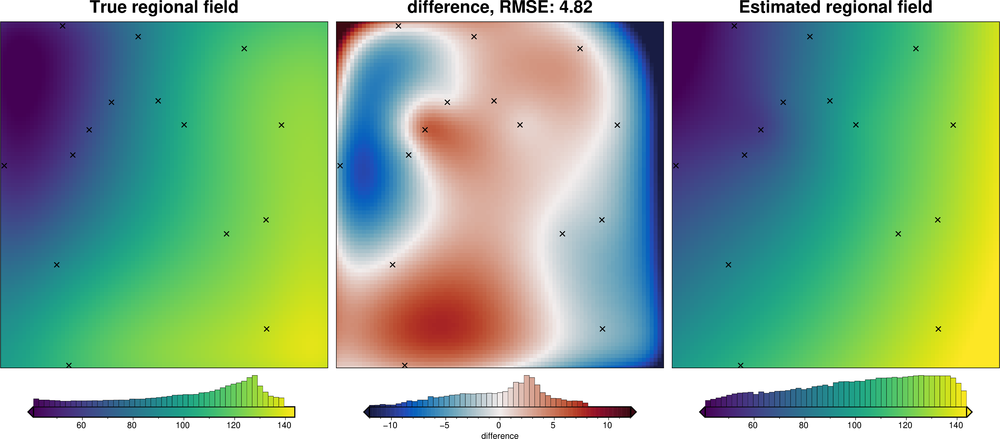

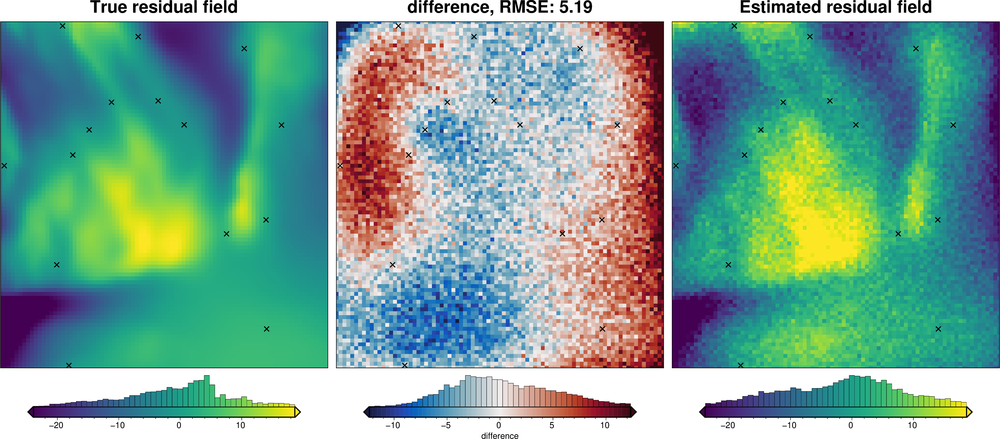

In [15]:
test_dfs, train_dfs = invert4geom.kfold_df_to_lists(block_kfold_split_df)

study, grav_data, best_trial = (
    invert4geom.optimize_regional_constraint_point_minimization(
        grav_ds=grav_data,
        testing_training_df=block_kfold_split_df,
        grid_method="pygmt",
        tension_factor_limits=(0, 1),
        n_trials=20,
        plot=True,
        fname="../tmp/study",
        optimize_on_true_regional_misfit=True,
        **kwargs,
    )
)

regional_comparison(grav_data)

#### Optimize without true regional

  0%|          | 0/20 [00:00<?, ?it/s]

`depth` only used if `grid_method` is 'eq_sources'


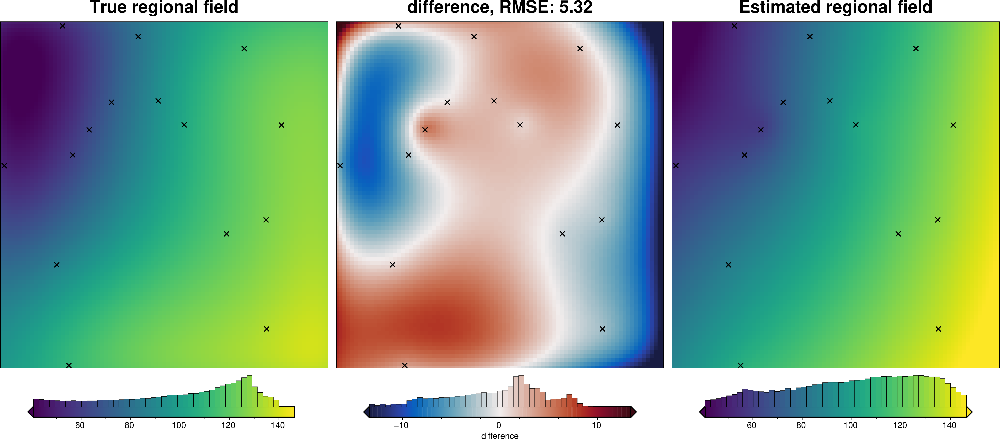

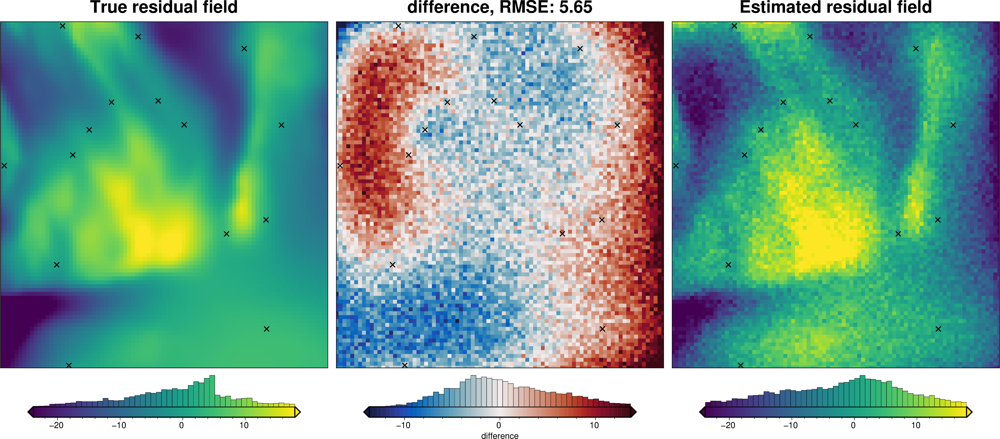

In [16]:
test_dfs, train_dfs = invert4geom.kfold_df_to_lists(block_kfold_split_df)

study, grav_data, best_trial = (
    invert4geom.optimize_regional_constraint_point_minimization(
        grav_ds=grav_data,
        testing_training_df=block_kfold_split_df,
        grid_method="pygmt",
        tension_factor_limits=(0, 1),
        n_trials=20,
        plot=True,
        fname="../tmp/study",
        # optimize_on_true_regional_misfit=True,
        **kwargs,
    )
)

regional_comparison(grav_data)

starting regional ensemble:   0%|          | 0/40 [00:00<?, ?it/s]

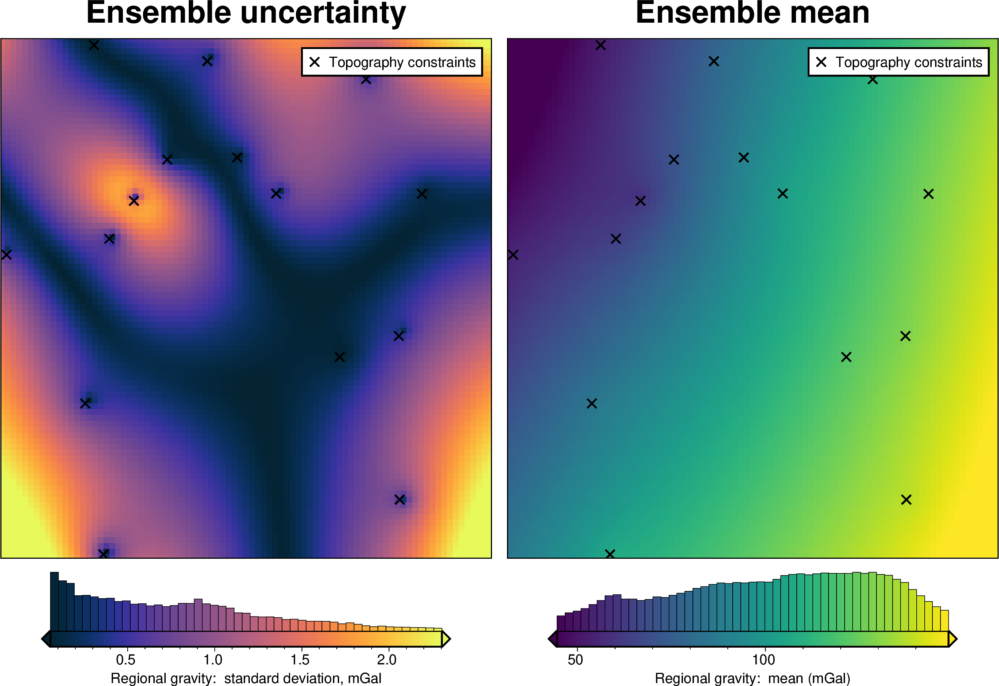

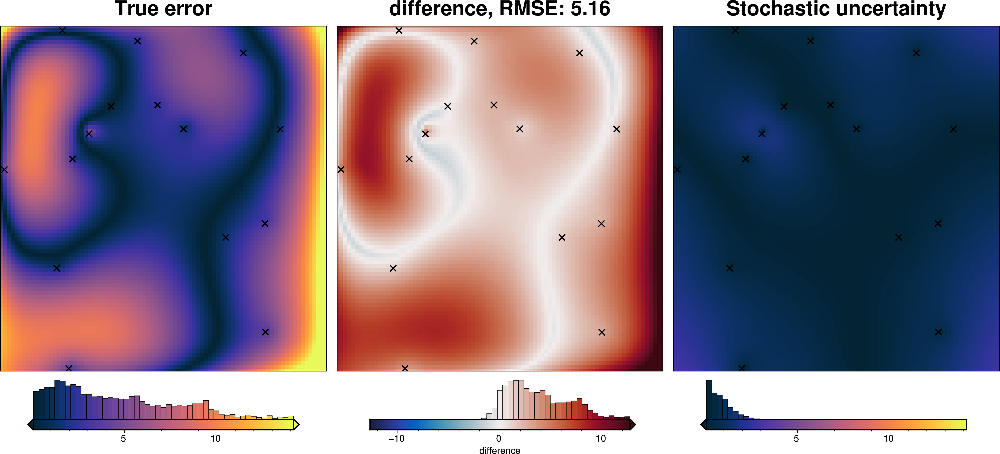

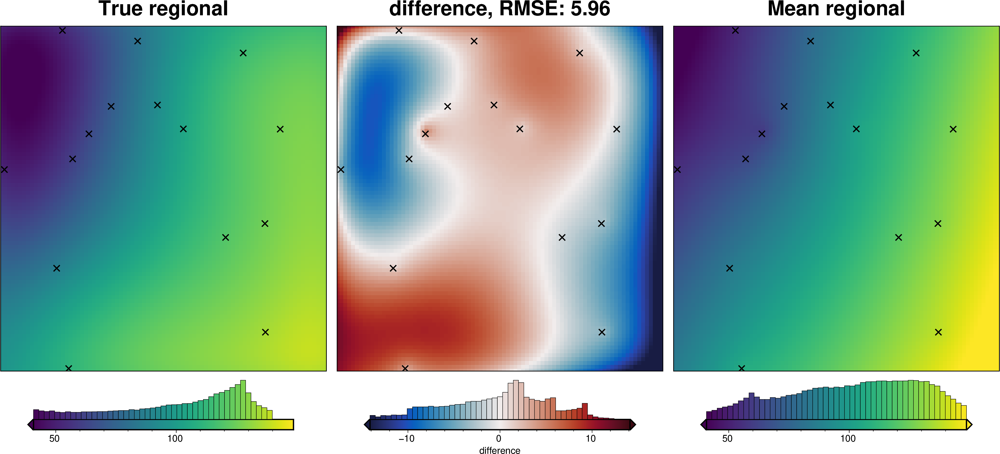

In [17]:
parameter_sampling_dict = {
    "tension_factor": {
        "distribution": "uniform",
        "loc": 0,  # lower bound
        "scale": 1,  # range
    },
}
regional_misfit_stats, _ = invert4geom.regional_misfit_uncertainty(
    grav_ds=grav_data,
    runs=40,
    parameter_dict=parameter_sampling_dict,
    method="constraints",
    grid_method="pygmt",
    constraints_df=constraint_points,
    **kwargs,
)

### Bi-Harmonic Splines with Verde
#### Optimize on true regional

  0%|          | 0/20 [00:00<?, ?it/s]

`depth` only used if `grid_method` is 'eq_sources'


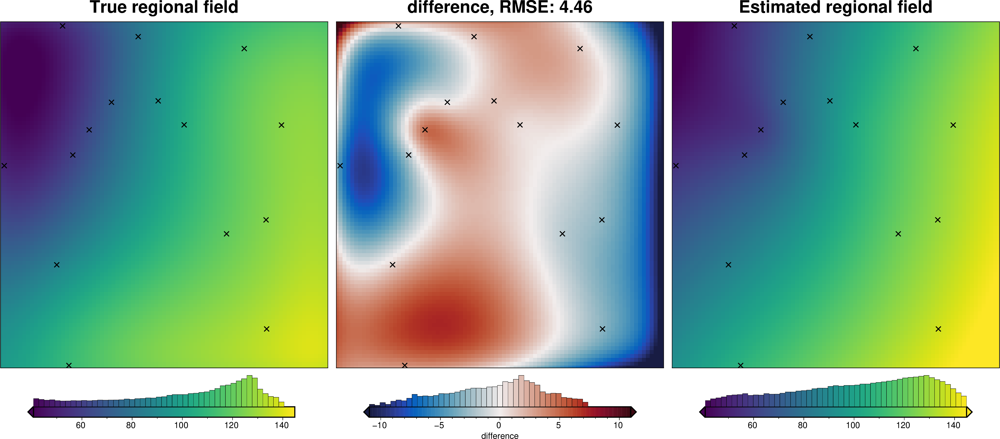

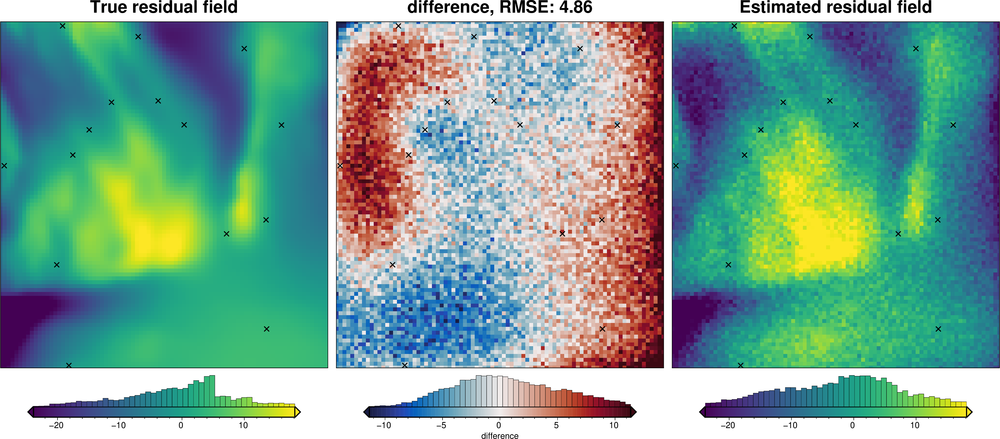

In [18]:
study, grav_data, best_trial = (
    invert4geom.optimize_regional_constraint_point_minimization(
        grav_ds=grav_data,
        testing_training_df=block_kfold_split_df,
        grid_method="verde",
        spline_damping_limits=(1e-15, 1),
        n_trials=20,
        plot=True,
        fname="../tmp/study",
        optimize_on_true_regional_misfit=True,
        **kwargs,
    )
)
regional_comparison(grav_data)

#### Optimize without true regional

  0%|          | 0/20 [00:00<?, ?it/s]

`depth` only used if `grid_method` is 'eq_sources'


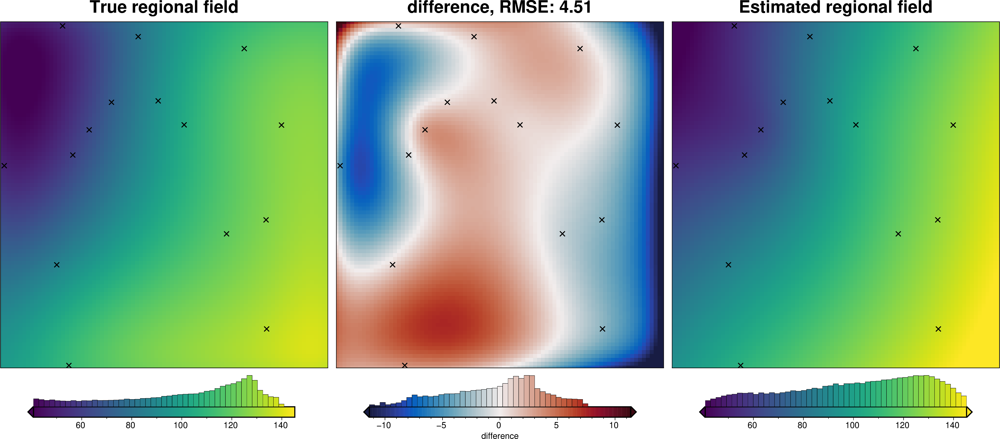

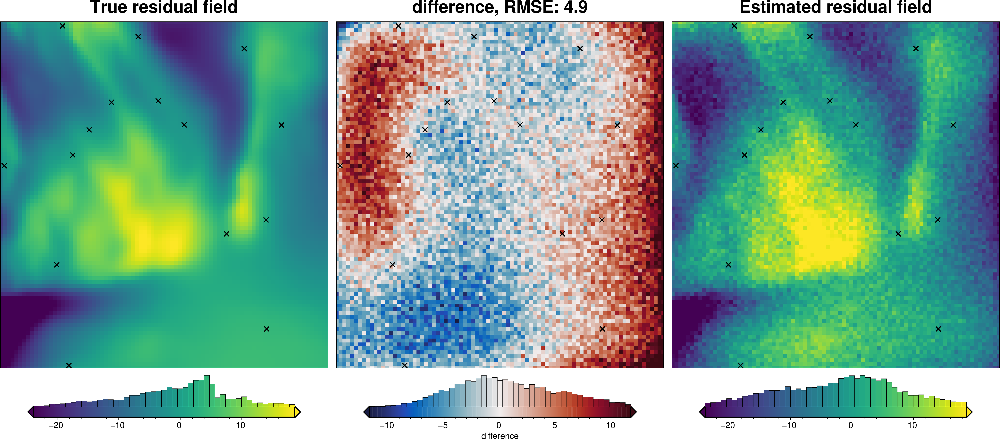

In [19]:
study, grav_data, best_trial = (
    invert4geom.optimize_regional_constraint_point_minimization(
        grav_ds=grav_data,
        testing_training_df=block_kfold_split_df,
        grid_method="verde",
        spline_damping_limits=(1e-15, 1),
        n_trials=20,
        plot=True,
        fname="../tmp/study",
        # optimize_on_true_regional_misfit=True,
        **kwargs,
    )
)
regional_comparison(grav_data)

Alternatively, we can use an internal cross-validation (CV) which finds the parameters which create the best fit to the sampled residual values at the constraints. This is faster and simpler, as the only step that is repeated for the CV is the fitting of splines to the data, and not the entire process of sample the misfit and remove the regional from this misfit to get the residual. However, this is less informed than the above K-fold CV as it isn't attempting to retain a high amplitude residual field, just trying to fit the data as best as possible.

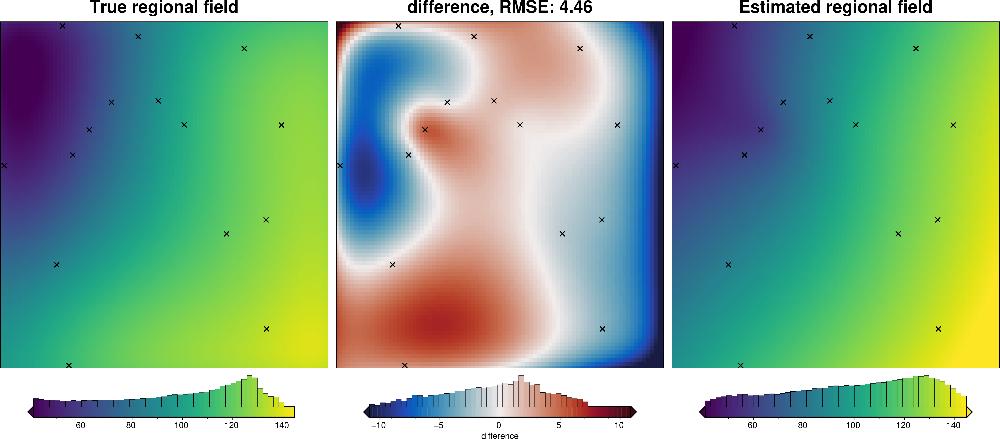

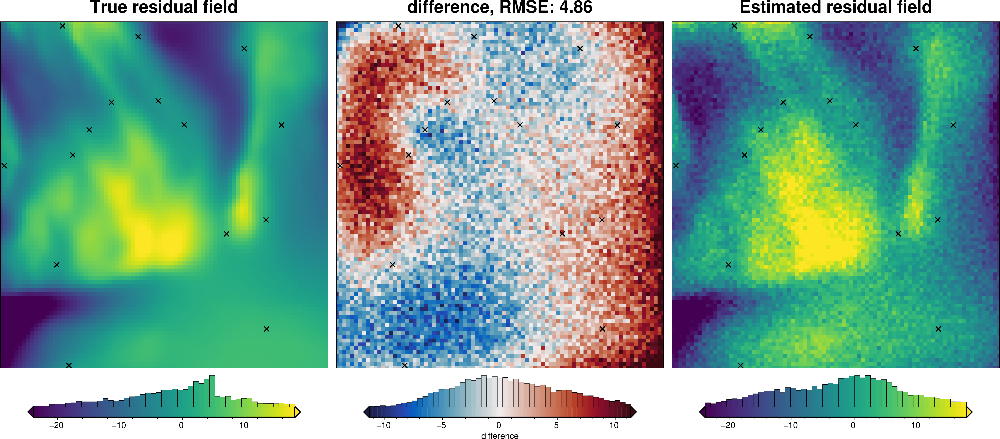

In [20]:
grav_data.inv.regional_separation(
    method="constraints",
    grid_method="verde",
    constraints_df=constraint_points,
    spline_dampings=[*list(np.logspace(-20, 1, 100)), None],
    **kwargs2,
)
regional_comparison(grav_data)

In [21]:
best_trial.params["spline_dampings"]

2.6358979721550307e-09

In [22]:
np.log10(best_trial.params["spline_dampings"])

np.float64(-8.579071404012632)

starting regional ensemble:   0%|          | 0/40 [00:00<?, ?it/s]

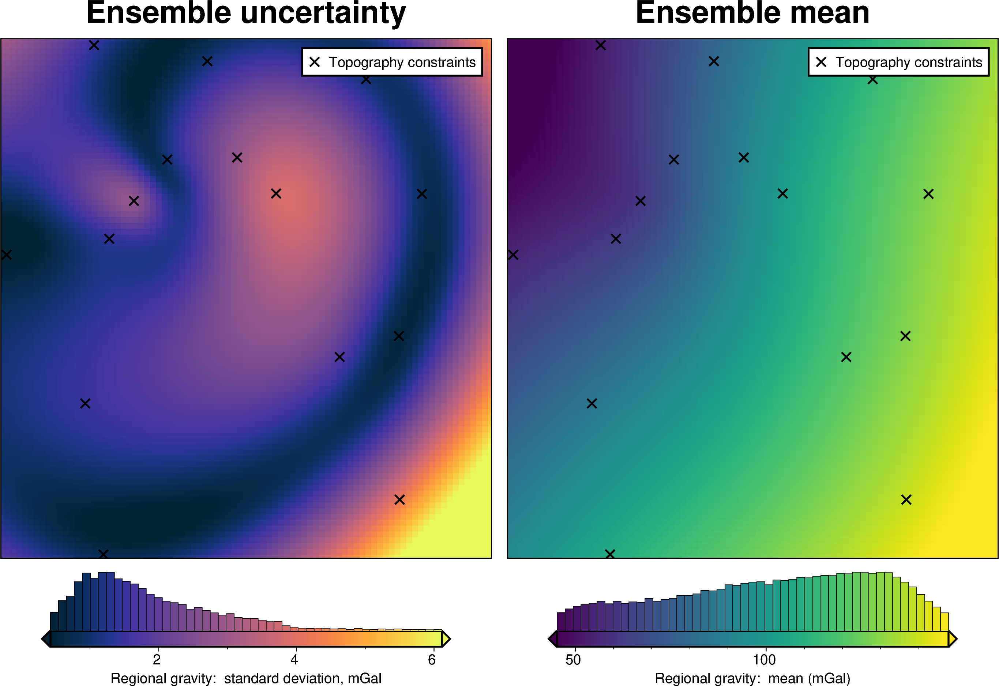

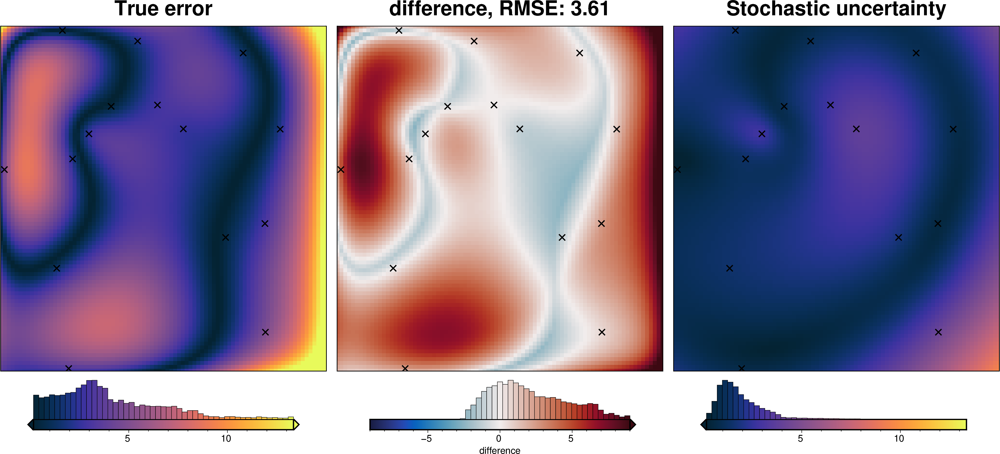

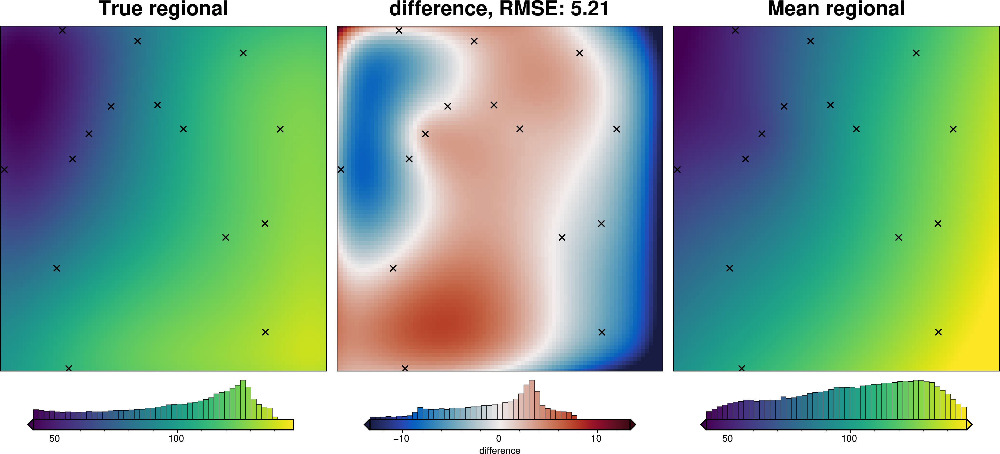

In [23]:
parameter_sampling_dict = {
    "spline_dampings": {
        # "distribution": "uniform",
        # "loc": -15,  # lower bound, 1e-15
        # "scale": 5,  # range, i.e. 1e-15 to 1e-10
        "distribution": "normal",
        "loc": np.log10(best_trial.params["spline_dampings"]),  # mean
        "scale": 2,  # stdev
        "log": True,
    },
}
regional_misfit_stats, _ = invert4geom.regional_misfit_uncertainty(
    grav_ds=grav_data,
    runs=40,
    parameter_dict=parameter_sampling_dict,
    method="constraints",
    grid_method="verde",
    constraints_df=constraint_points,
    **kwargs,
)

#### Equivalent Sources with Harmonica


  0%|          | 0/20 [00:00<?, ?it/s]

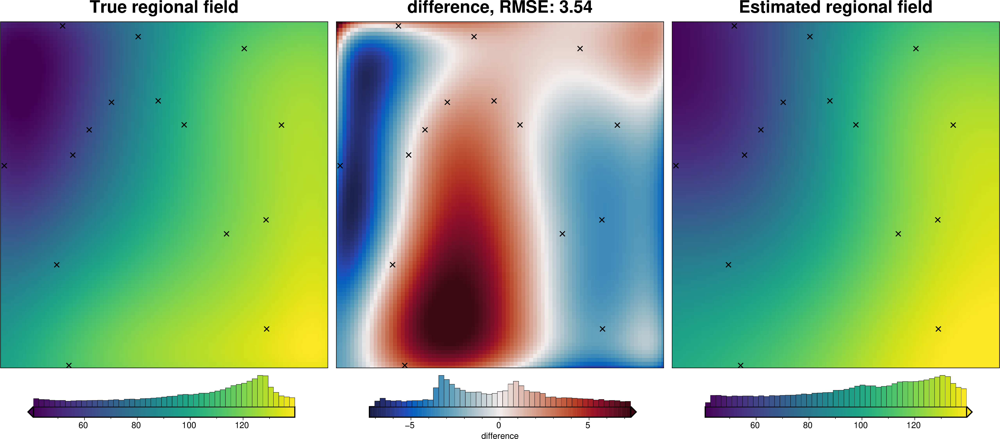

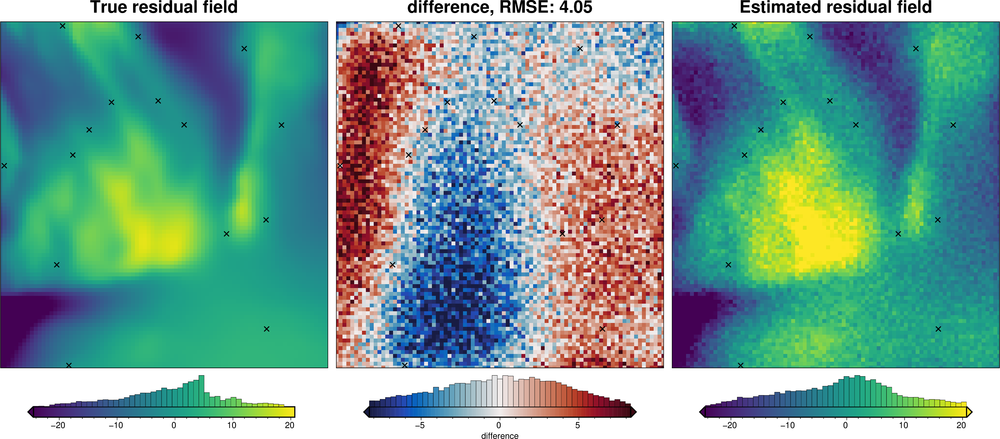

In [24]:
# mean_constraint_distance = np.mean(
#     vd.median_distance(
#         (constraint_points.easting, constraint_points.northing),
#         k_nearest=1,
#         ),
#     )

study, grav_data, best_trial = (
    invert4geom.optimize_regional_constraint_point_minimization(
        grav_ds=grav_data,
        testing_training_df=block_kfold_split_df,
        grid_method="eq_sources",
        damping_limits=(1e-15, 1),
        # depth_limits=(2.5 * mean_constraint_distance, 6 *mean_constraint_distance),
        # block_size_limits=[spacing, spacing * 20],
        # grav_obs_height_limits=(1, 100e3),
        # if limits are omitted, must provide constant values
        damping=None,
        depth="default",
        block_size=None,
        # grav_obs_height=1e3,
        n_trials=20,
        plot=True,
        fname="../tmp/study",
        optimize_on_true_regional_misfit=True,
        **kwargs,
    )
)

regional_comparison(grav_data)

  0%|          | 0/20 [00:00<?, ?it/s]

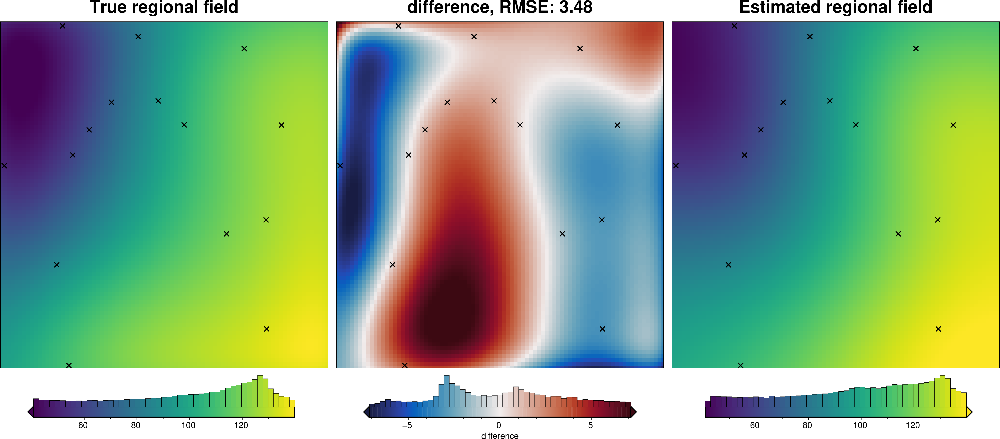

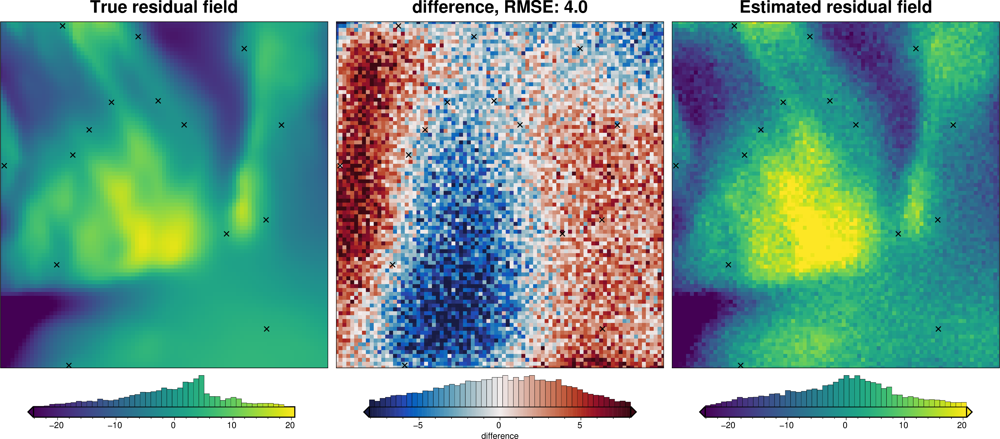

In [25]:
study, grav_data, best_trial = (
    invert4geom.optimize_regional_constraint_point_minimization(
        grav_ds=grav_data,
        testing_training_df=block_kfold_split_df,
        grid_method="eq_sources",
        damping_limits=(1e-15, 1),
        # depth_limits=(2.5 * mean_constraint_distance, 6 *mean_constraint_distance),
        # block_size_limits=[spacing, spacing * 20],
        # grav_obs_height_limits=(1, 100e3),
        # if limits are omitted, must provide constant values
        damping=None,
        depth="default",
        block_size=None,
        # grav_obs_height=1e3,
        n_trials=20,
        plot=True,
        fname="../tmp/study",
        # optimize_on_true_regional_misfit=True,
        **kwargs,
    )
)

regional_comparison(grav_data)

Alternatively, we can use an internal CV which finds the parameters which create the best fit to the sampled residual values at the constraits. This is faster and simplier, as the only step that is repeated for the CV is the fitting of equivalent sources to the data, and not the entire process of sample the misfit and remove the regional from this misfit to get the residual. However, this is less informed than the above K-fold CV as it isn't attempting to retain a high amplitude residual field, just trying to fit the data as best as possible.

In [26]:
grav_data.inv.regional_separation(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    cv=True,
    cv_kwargs=dict(
        n_trials=40, damping_limits=(1e-15, 1), plot=True, fname="../tmp/regional_sep"
    ),
    grav_obs_height=1e3,
    depth="default",
    block_size=None,
    **kwargs2,
)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

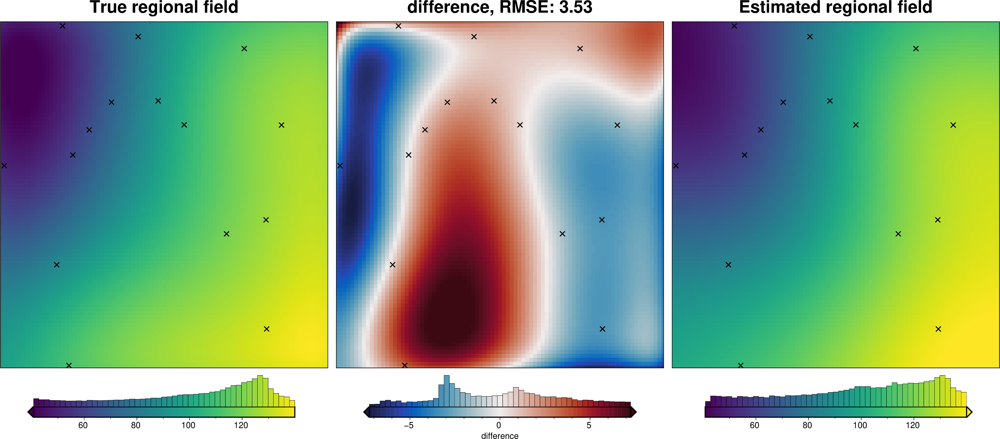

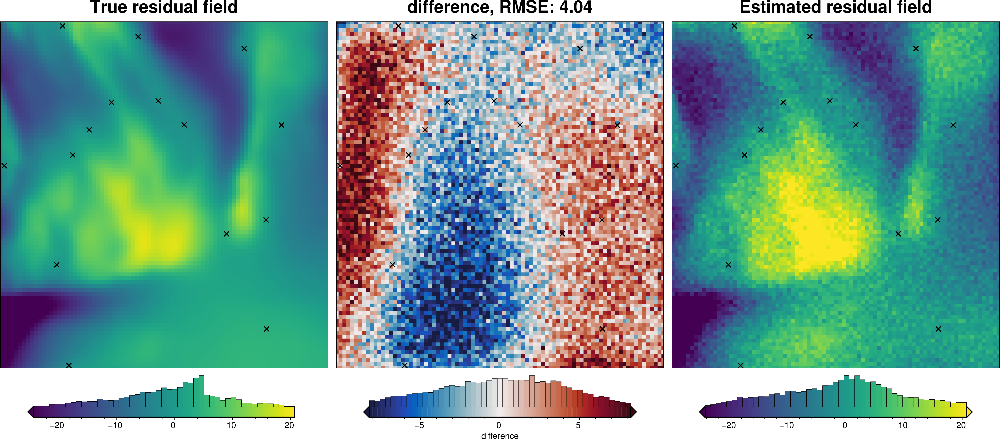

In [27]:
regional_comparison(grav_data)

In [28]:
# re-load the study from the saved pickle file
with pathlib.Path("../tmp/regional_sep.pickle").open("rb") as f:
    study = pickle.load(f)
eq_damping = min(study.best_trials, key=lambda t: t.values[0]).params["damping"]  # noqa: PD011
eq_damping

6.387889109407879e-09

In [29]:
np.log10(eq_damping)

np.float64(-8.194642631605292)

starting regional ensemble:   0%|          | 0/40 [00:00<?, ?it/s]

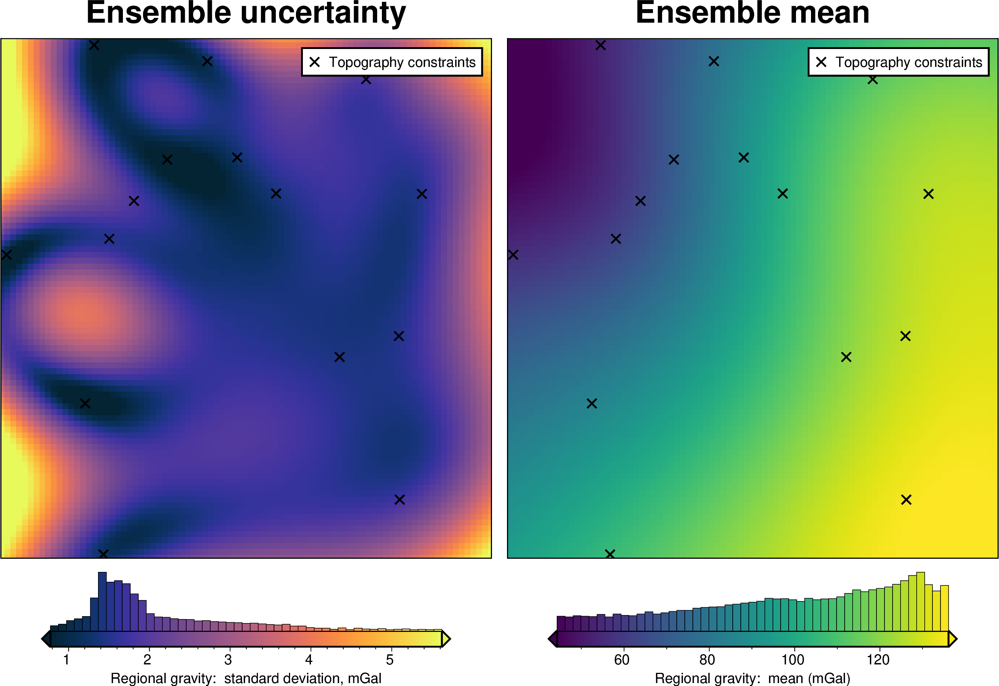

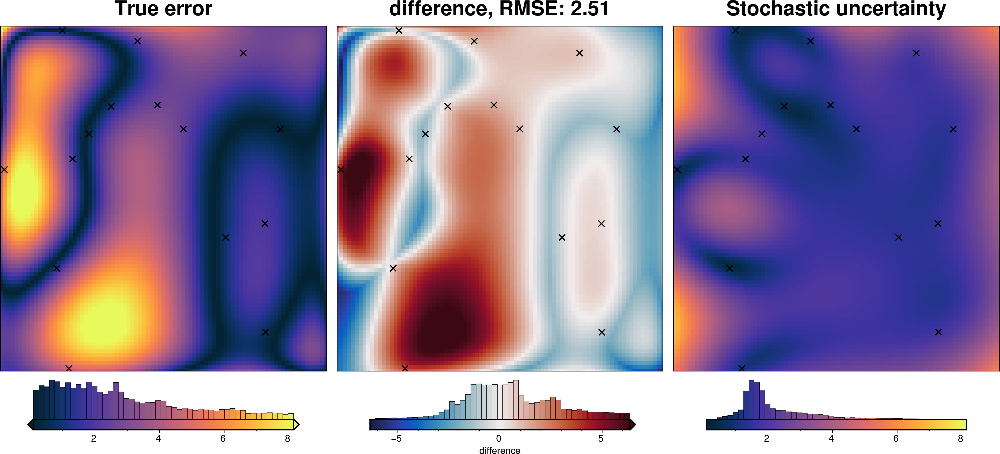

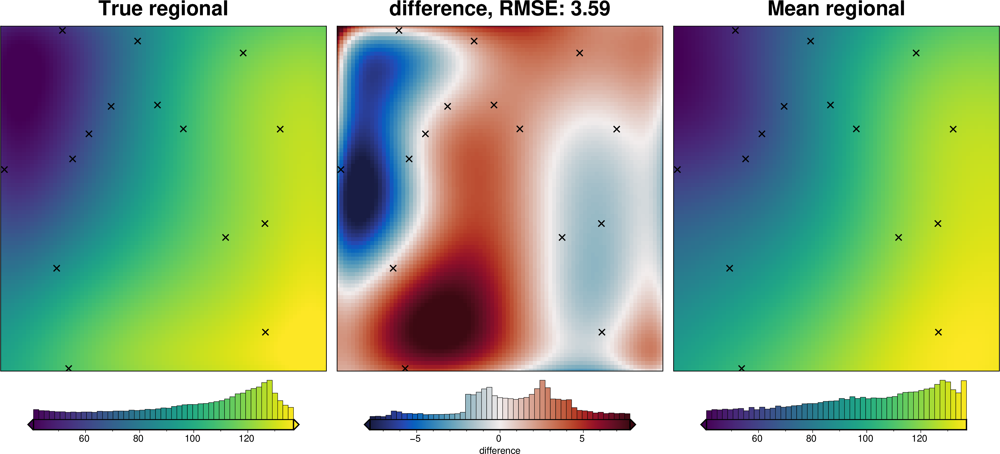

In [30]:
mean_constraint_distance = np.mean(
    vd.median_distance(
        (constraint_points.easting, constraint_points.northing), k_nearest=1
    )
)

parameter_sampling_dict = {
    "depth": {
        "distribution": "uniform",
        "loc": 2.5 * mean_constraint_distance,  # lower bound
        "scale": 3.5 * mean_constraint_distance,  # range
    },
    "grav_obs_height": {
        "distribution": "uniform",
        "loc": 0,  # lower bound
        "scale": 10e3,  # range
    },
    # "damping": {
    #     "distribution": "uniform",
    #     "loc": -15, # lower bound
    #     "scale": 10, # range
    #     "log":True,
    # },
    "damping": {
        "distribution": "normal",
        "loc": np.log10(eq_damping),  # mean
        "scale": 2,  # stdev
        "log": True,
    },
}
regional_misfit_stats, _ = invert4geom.regional_misfit_uncertainty(
    grav_ds=grav_data,
    runs=40,
    parameter_dict=parameter_sampling_dict,
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    damping=eq_damping,
    depth="default",
    block_size=None,
    **kwargs,
)